# **Importing the libraries**

In [1]:
import numpy as np
from numpy import all, any, array, arctan2, cos, sin, exp, dot, log, logical_and, roll, sqrt, stack, trace, unravel_index, pi, deg2rad, rad2deg, where, zeros, floor, full, nan, isnan, round, float32
from numpy.linalg import det, lstsq, norm
import cv2
from cv2 import resize, GaussianBlur, subtract, KeyPoint, INTER_LINEAR, INTER_NEAREST
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from functools import cmp_to_key
import time
import logging

# **Initialize parameters (these are used globbally)**

In [2]:
sigma = 1.6
assumed_blur = 0.5
num_intervals = 4
image_border_width= 5

logger = logging.getLogger(__name__)
float_tolerance = 1e-7

# **Load and Display both images**

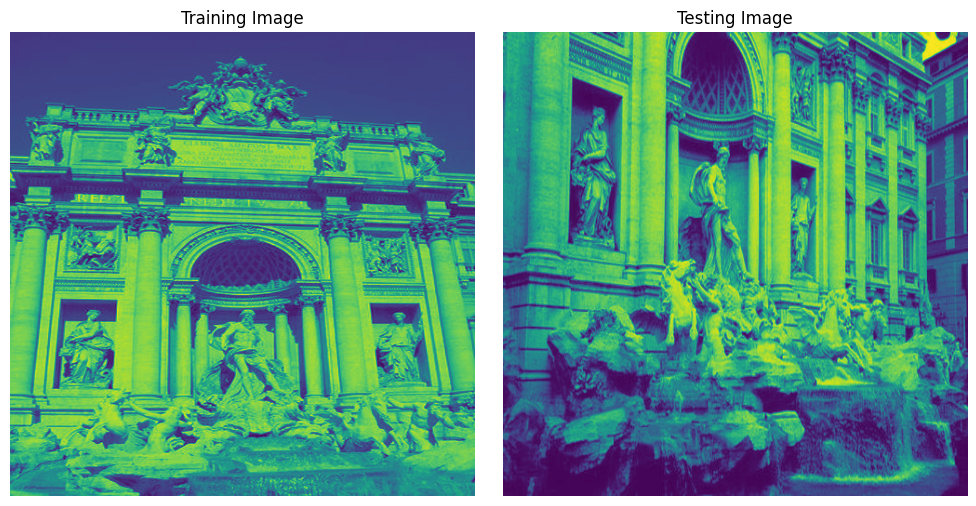

Run Time : 0.8707473278045654


In [3]:
start = time.time()
# Load the Images
img1 = cv2.imread('/content/image_1.jpg', 0)
img2 = cv2.imread("/content/image_2.jpg",0)

# Resize the image
training_image = cv2.resize(img1, (500, 500))
test_image = cv2.resize(img2, (500, 500))

# Display the training image and testing image
plt.figure(figsize=(10, 5))

# Training image
plt.subplot(1, 2, 1)
plt.title("Training Image")
plt.imshow(training_image)
plt.axis("off")  # Optional: Hide axes for better visualization

# Testing image
plt.subplot(1, 2, 2)
plt.title("Testing Image")
plt.imshow(test_image)
plt.axis("off")  # Optional: Hide axes for better visualization

# Show the images
plt.tight_layout()
plt.show()

end = time.time()
runtime1 = end - start
print(f"Run Time : {runtime1}")

# **Converting image to float**

In [4]:
start = time.time()
# Convert images to float32
image1 = img1.astype('float32')
image2 = img2.astype('float32')
print(f"Image 1 : {image1}")
print(f"Imag 1 Shape : {image1.shape}")
print(f"Image 2 : {image2}")
print(f"Imag 2 Shape : {image2.shape}")
end = time.time()
runtime2 = end - start
print(f"Run Time : {runtime2}")

Image 1 : [[ 38.  38.  38. ...  43.  43.  43.]
 [ 38.  38.  39. ...  43.  43.  43.]
 [ 38.  39.  39. ...  43.  43.  43.]
 ...
 [161. 163. 167. ...  92. 100. 111.]
 [154. 157. 162. ... 101. 109. 120.]
 [149. 152. 157. ... 107. 115. 126.]]
Imag 1 Shape : (731, 548)
Image 2 : [[ 63.  67.  75. ...  75.  84.  87.]
 [130.  91.  64. ...  88.  91.  90.]
 [183. 110.  60. ...  99.  97.  93.]
 ...
 [  8.   8.   7. ...   5.   5.   5.]
 [  7.   7.   7. ...   5.   5.   5.]
 [  6.   6.   6. ...   5.   5.   5.]]
Imag 2 Shape : (480, 684)
Run Time : 0.0067670345306396484


# **Generate Base Image**

In [5]:
start = time.time()
def generateBaseImage(image, sigma, assumed_blur):
    image = resize(image, (0, 0), fx=2, fy=2, interpolation=INTER_LINEAR)
    sigma_diff = sqrt(max((sigma ** 2) - ((2 * assumed_blur) ** 2), 0.01))
    return GaussianBlur(image, (0, 0), sigmaX=sigma_diff, sigmaY=sigma_diff)  # the image blur is now sigma instead of assumed_blur

base_image1 = generateBaseImage(image1, sigma, assumed_blur)
base_image2 = generateBaseImage(image2, sigma, assumed_blur)
print(f"Base image 1 : {base_image1}")
print(f"Base image 2 : {base_image2}")

end = time.time()
runtime3 = end - start
print(f"Run Time : {runtime3}")

Base image 1 : [[ 38.006844  38.015747  38.051895 ...  43.000004  43.000004  43.000004]
 [ 38.015747  38.02967   38.080498 ...  43.000004  43.000004  43.000004]
 [ 38.051903  38.080498  38.169243 ...  43.000004  43.000004  43.000004]
 ...
 [154.1532   154.60326  155.85678  ... 112.5926   116.10518  117.53176 ]
 [152.18356  152.646    153.93236  ... 115.03287  118.55501  119.98564 ]
 [151.44917  151.91507  153.21074  ... 115.936935 119.45996  120.89096 ]]
Base image 2 : [[ 80.39434    79.34937    76.913216  ...  85.655045   86.899765
   87.29272  ]
 [ 87.53296    85.74233    81.455536  ...  86.5224     87.55208
   87.865875 ]
 [105.24783   101.61955    92.78347   ...  88.70635    89.20356
   89.32184  ]
 ...
 [  6.7846656   6.78039     6.7642455 ...   5.0000167   5.0000005
    5.0000005]
 [  6.4372177   6.4361763   6.432054  ...   5.00001     5.0000005
    5.0000005]
 [  6.3003607   6.3000436   6.298764  ...   5.0000076   5.0000005
    5.0000005]]
Run Time : 0.07549738883972168


Shape of Base image 1 : (1462, 1096)
Shape of Base image 2 : (960, 1368)


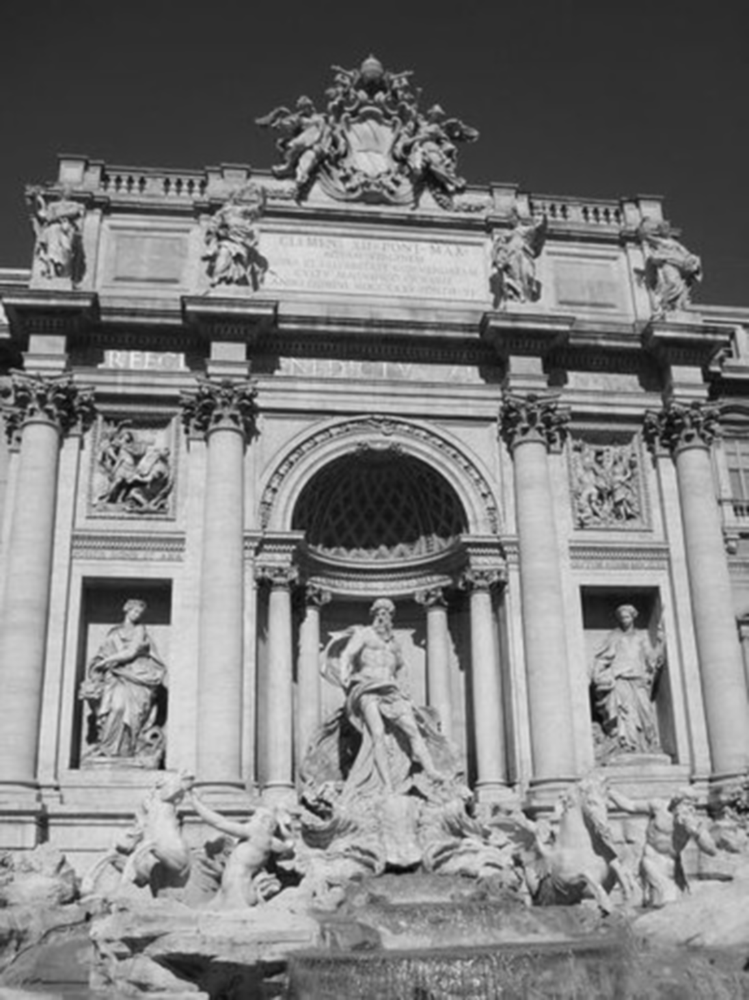

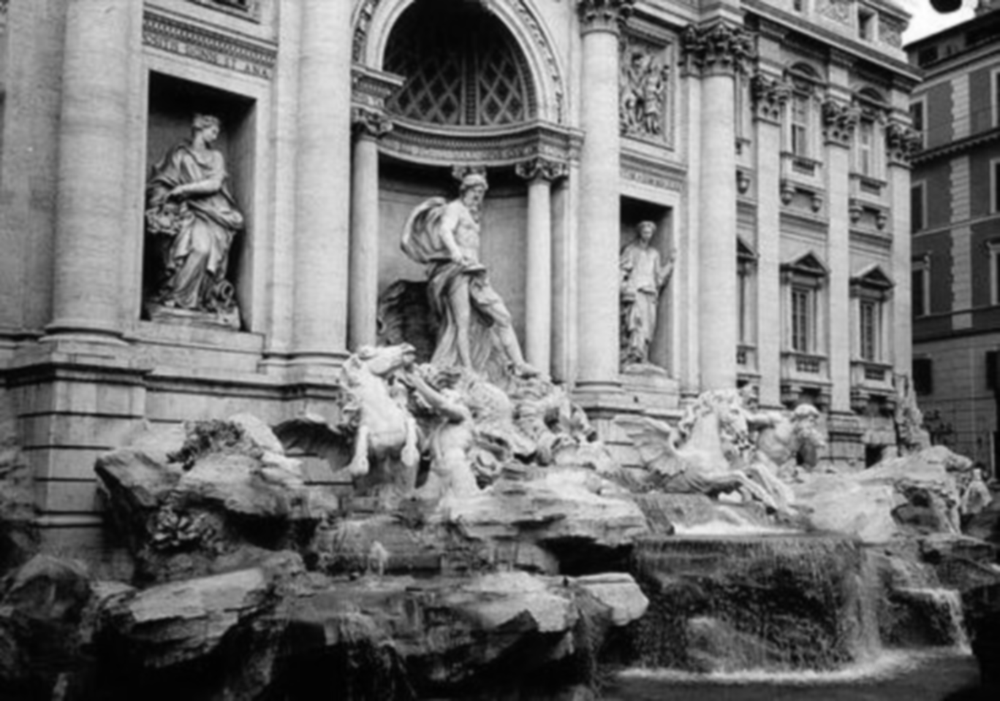

In [10]:
print(f"Shape of Base image 1 : {base_image1.shape}")
print(f"Shape of Base image 2 : {base_image2.shape}")
cv2.imwrite('base_image.jpg', base_image1)
cv2_imshow(base_image1)
cv2.imwrite('base_image2.jpg', base_image2)
cv2_imshow(base_image2)

# **Computer Number of Octaves**

In [11]:
start = time.time()
def computeNumberOfOctaves(image_shape):
    return int(round(log(min(image_shape)) / log(2) - 1))

num_octaves1 = computeNumberOfOctaves(base_image1.shape)
num_octaves2 = computeNumberOfOctaves(base_image2.shape)
print(f'Number of Octaves for Image 1 :{num_octaves1}')
print(f'Number of Octaves for Image 2 :{num_octaves2}')

end = time.time()
runtime4 = end - start
print(f"Run Time : {runtime4}")

Number of Octaves for Image 1 :9
Number of Octaves for Image 2 :9
Run Time : 0.0006985664367675781


# **Generate Gaussian Kernels**

In [33]:
start = time.time()
def generateGaussianKernels(sigma, num_intervals):
    num_images_per_octave = num_intervals + 3
    k = 2 ** (1. / num_intervals)
    gaussian_kernels = zeros(num_images_per_octave)  # scale of gaussian blur necessary to go from one blur scale to the next within an octave
    gaussian_kernels[0] = sigma

    for image_index in range(1, num_images_per_octave):
        sigma_previous = (k ** (image_index - 1)) * sigma
        sigma_total = k * sigma_previous
        gaussian_kernels[image_index] = sqrt(sigma_total ** 2 - sigma_previous ** 2)
    return gaussian_kernels
gaussian_kernels = generateGaussianKernels(sigma, num_intervals)
print(f"Sigma Values used in Gaussian Kernel : {gaussian_kernels}")

end = time.time()
runtime5 = end - start
print(f"Run Time : {runtime5}")

Sigma Values used in Gaussian Kernel : [1.6        1.0297508  1.22458698 1.45628755 1.73182752 2.05950161
 2.44917397]
Run Time : 0.0007326602935791016


# **Generate Gaussian Images**

In [34]:
start = time.time()
def generateGaussianImages(image, num_octaves, gaussian_kernels):
    gaussian_images = []

    for octave_index in range(num_octaves):
        gaussian_images_in_octave = []
        gaussian_images_in_octave.append(image)  # first image in octave already has the correct blur
        for gaussian_kernel in gaussian_kernels[1:]:
            image = GaussianBlur(image, (0, 0), sigmaX=gaussian_kernel, sigmaY=gaussian_kernel)
            gaussian_images_in_octave.append(image)
        gaussian_images.append(gaussian_images_in_octave)
        octave_base = gaussian_images_in_octave[-3]
        image = resize(octave_base, (int(octave_base.shape[1] / 2), int(octave_base.shape[0] / 2)), interpolation=INTER_NEAREST)
    return array(gaussian_images, dtype=object)

gaussian_images1 = generateGaussianImages(base_image1, num_octaves1, gaussian_kernels)
gaussian_images2 = generateGaussianImages(base_image2, num_octaves2, gaussian_kernels)

end = time.time()
runtime6 = end - start
print(f"Run Time : {runtime6}")

Run Time : 0.15060830116271973


# **Generate DoG Image**

In [37]:
start = time.time()
def generateDoGImages(gaussian_images):
    dog_images = []

    for gaussian_images_in_octave in gaussian_images:
        dog_images_in_octave = []
        for first_image, second_image in zip(gaussian_images_in_octave, gaussian_images_in_octave[1:]):
            dog_images_in_octave.append(subtract(second_image, first_image))  # ordinary subtraction will not work because the images are unsigned integers
        dog_images.append(dog_images_in_octave)
    return array(dog_images, dtype=object)

dog_images1 = generateDoGImages(gaussian_images1)
dog_images2 = generateDoGImages(gaussian_images2)

end = time.time()
runtime21 = end - start
print(f"Run Time : {runtime21}")

Run Time : 0.04280567169189453


Plot Octave Images

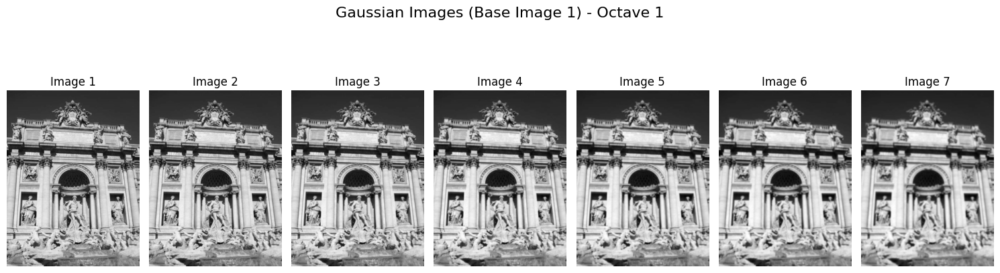

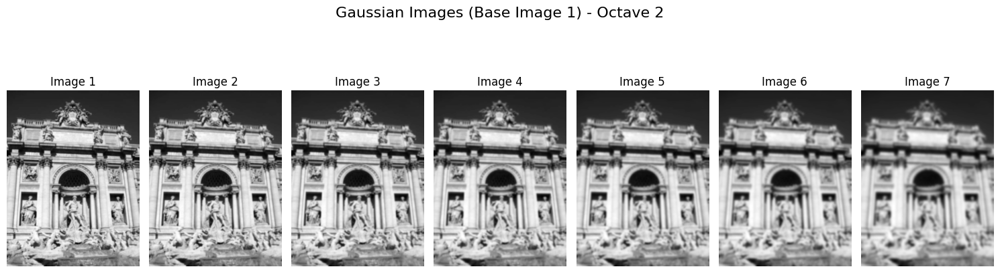

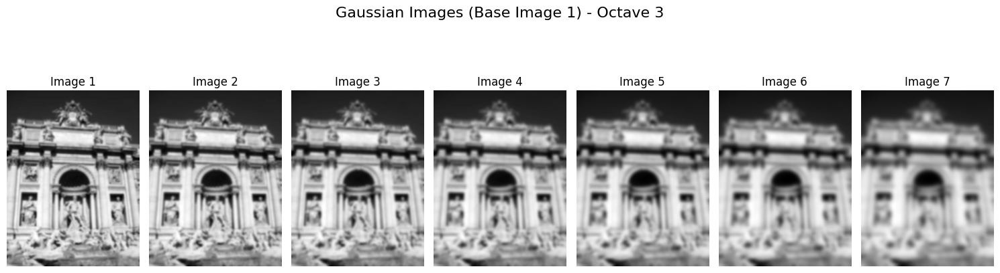

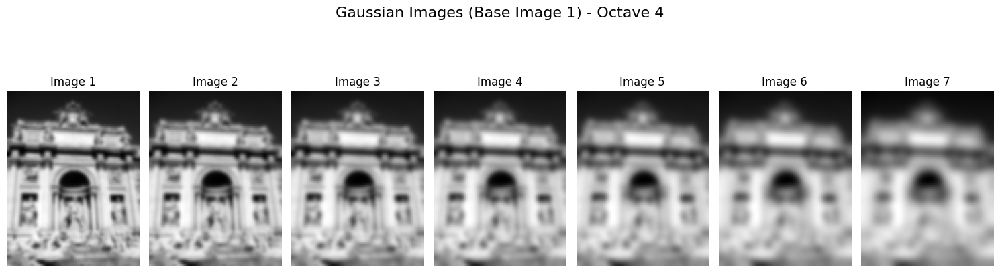

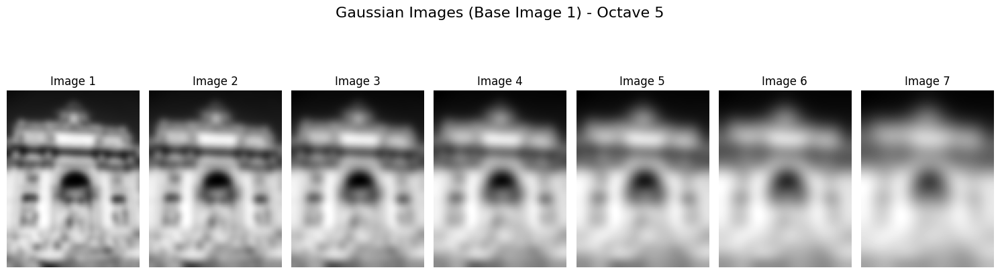

...

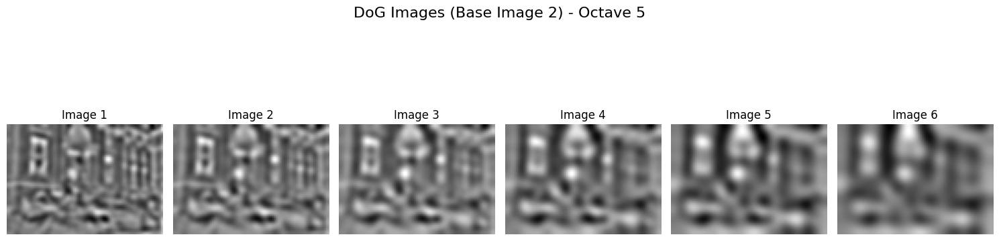

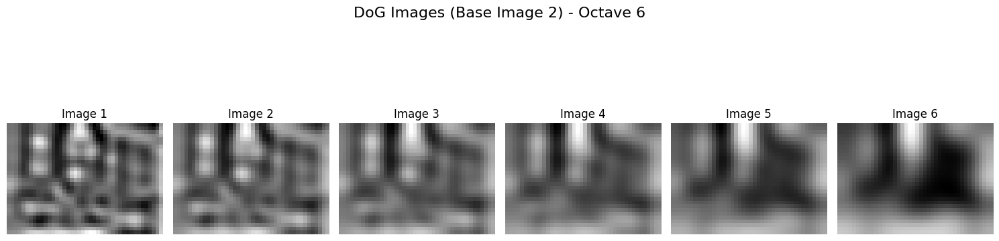

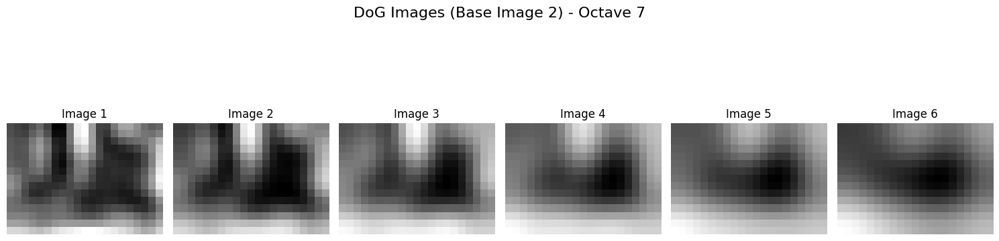

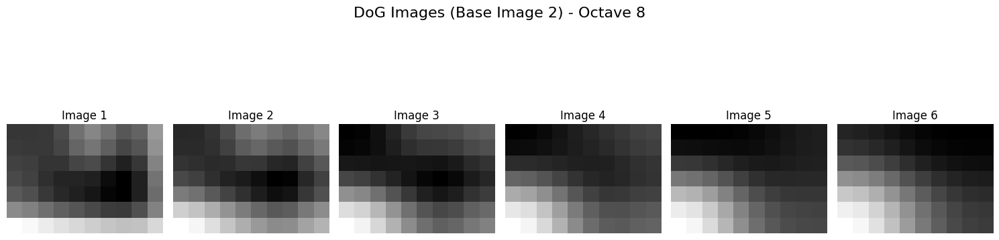

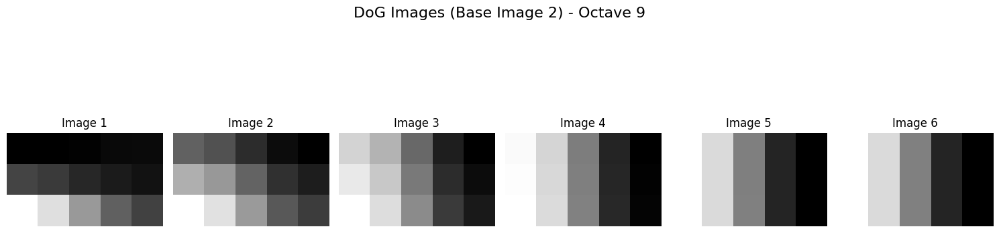

In [15]:
def plot_octave_images(images, title, num_octaves):
    for octave_index, images_in_octave in enumerate(images):
        num_images = len(images_in_octave)
        fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
        fig.suptitle(f"{title} - Octave {octave_index + 1}", fontsize=16)

        for i, image in enumerate(images_in_octave):
            ax = axes[i]
            ax.imshow(image, cmap='gray')
            ax.set_title(f"Image {i + 1}")
            ax.axis("off")

        plt.tight_layout()
        plt.show()

# Plot Gaussian images
plot_octave_images(gaussian_images1, title="Gaussian Images (Base Image 1)", num_octaves=num_octaves1)
plot_octave_images(gaussian_images2, title="Gaussian Images (Base Image 2)", num_octaves=num_octaves2)

# Plot DoG images
plot_octave_images(dog_images1, title="DoG Images (Base Image 1)", num_octaves=num_octaves1)
plot_octave_images(dog_images2, title="DoG Images (Base Image 2)", num_octaves=num_octaves2)

# **Scale Space Extrema of Keypoints**

1. Is Pixel and Extremum

In [16]:
start = time.time()
def isPixelAnExtremum(first_subimage, second_subimage, third_subimage, threshold):
    center_pixel_value = second_subimage[1, 1]
    if abs(center_pixel_value) > threshold:
        if center_pixel_value > 0:
            return all(center_pixel_value >= first_subimage) and \
                   all(center_pixel_value >= third_subimage) and \
                   all(center_pixel_value >= second_subimage[0, :]) and \
                   all(center_pixel_value >= second_subimage[2, :]) and \
                   center_pixel_value >= second_subimage[1, 0] and \
                   center_pixel_value >= second_subimage[1, 2]
        elif center_pixel_value < 0:
            return all(center_pixel_value <= first_subimage) and \
                   all(center_pixel_value <= third_subimage) and \
                   all(center_pixel_value <= second_subimage[0, :]) and \
                   all(center_pixel_value <= second_subimage[2, :]) and \
                   center_pixel_value <= second_subimage[1, 0] and \
                   center_pixel_value <= second_subimage[1, 2]
    return False

end = time.time()
runtime7 = end - start
print(f"Run Time : {runtime7}")

Run Time : 0.00044918060302734375


2. Localize Extremum Via Quadratic Fit

In [17]:
start = time.time()
def localizeExtremumViaQuadraticFit(i, j, image_index, octave_index, num_intervals, dog_images_in_octave, sigma, contrast_threshold, image_border_width, eigenvalue_ratio=10, num_attempts_until_convergence=5):
    extremum_is_outside_image = False
    image_shape = dog_images_in_octave[0].shape
    for attempt_index in range(num_attempts_until_convergence):
        # need to convert from uint8 to float32 to compute derivatives and need to rescale pixel values to [0, 1] to apply Lowe's thresholds
        first_image, second_image, third_image = dog_images_in_octave[image_index-1:image_index+2]
        pixel_cube = stack([first_image[i-1:i+2, j-1:j+2],
                            second_image[i-1:i+2, j-1:j+2],
                            third_image[i-1:i+2, j-1:j+2]]).astype('float32') / 255.
        gradient = computeGradientAtCenterPixel(pixel_cube)
        hessian = computeHessianAtCenterPixel(pixel_cube)
        extremum_update = -lstsq(hessian, gradient, rcond=None)[0]
        if abs(extremum_update[0]) < 0.5 and abs(extremum_update[1]) < 0.5 and abs(extremum_update[2]) < 0.5:
            break
        j += int(round(extremum_update[0]))
        i += int(round(extremum_update[1]))
        image_index += int(round(extremum_update[2]))
        # make sure the new pixel_cube will lie entirely within the image
        if i < image_border_width or i >= image_shape[0] - image_border_width or j < image_border_width or j >= image_shape[1] - image_border_width or image_index < 1 or image_index > num_intervals:
            extremum_is_outside_image = True
            break
    if extremum_is_outside_image:
        logger.debug('Updated extremum moved outside of image before reaching convergence. Skipping...')
        return None
    if attempt_index >= num_attempts_until_convergence - 1:
        logger.debug('Exceeded maximum number of attempts without reaching convergence for this extremum. Skipping...')
        return None
    functionValueAtUpdatedExtremum = pixel_cube[1, 1, 1] + 0.5 * dot(gradient, extremum_update)
    if abs(functionValueAtUpdatedExtremum) * num_intervals >= contrast_threshold:
        xy_hessian = hessian[:2, :2]
        xy_hessian_trace = trace(xy_hessian)
        xy_hessian_det = det(xy_hessian)
        if xy_hessian_det > 0 and eigenvalue_ratio * (xy_hessian_trace ** 2) < ((eigenvalue_ratio + 1) ** 2) * xy_hessian_det:
            # Contrast check passed -- construct and return OpenCV KeyPoint object
            keypoint = KeyPoint()
            keypoint.pt = ((j + extremum_update[0]) * (2 ** octave_index), (i + extremum_update[1]) * (2 ** octave_index))
            keypoint.octave = octave_index + image_index * (2 ** 8) + int(round((extremum_update[2] + 0.5) * 255)) * (2 ** 16)
            keypoint.size = sigma * (2 ** ((image_index + extremum_update[2]) / float32(num_intervals))) * (2 ** (octave_index + 1))  # octave_index + 1 because the input image was doubled
            keypoint.response = abs(functionValueAtUpdatedExtremum)
            return keypoint, image_index
    return None

end = time.time()
runtime8 = end - start
print(f"Run Time : {runtime8}")

Run Time : 0.0009522438049316406


3. Comput Gradient at Center Pixels

In [18]:
start =  time.time()
def computeGradientAtCenterPixel(pixel_array):
    # With step size h, the central difference formula of order O(h^2) for f'(x) is (f(x + h) - f(x - h)) / (2 * h)
    # Here h = 1, so the formula simplifies to f'(x) = (f(x + 1) - f(x - 1)) / 2
    # NOTE: x corresponds to second array axis, y corresponds to first array axis, and s (scale) corresponds to third array axis
    dx = 0.5 * (pixel_array[1, 1, 2] - pixel_array[1, 1, 0])
    dy = 0.5 * (pixel_array[1, 2, 1] - pixel_array[1, 0, 1])
    ds = 0.5 * (pixel_array[2, 1, 1] - pixel_array[0, 1, 1])
    return array([dx, dy, ds])

end = time.time()
runtime9 = end - start
print(f"Run Time : {runtime9}")

Run Time : 0.0002460479736328125


4. Compute Hessian at Center Pixels

In [19]:
start = time.time()
def computeHessianAtCenterPixel(pixel_array):
    # With step size h, the central difference formula of order O(h^2) for f''(x) is (f(x + h) - 2 * f(x) + f(x - h)) / (h ^ 2)
    # Here h = 1, so the formula simplifies to f''(x) = f(x + 1) - 2 * f(x) + f(x - 1)
    # With step size h, the central difference formula of order O(h^2) for (d^2) f(x, y) / (dx dy) = (f(x + h, y + h) - f(x + h, y - h) - f(x - h, y + h) + f(x - h, y - h)) / (4 * h ^ 2)
    # Here h = 1, so the formula simplifies to (d^2) f(x, y) / (dx dy) = (f(x + 1, y + 1) - f(x + 1, y - 1) - f(x - 1, y + 1) + f(x - 1, y - 1)) / 4
    # NOTE: x corresponds to second array axis, y corresponds to first array axis, and s (scale) corresponds to third array axis
    center_pixel_value = pixel_array[1, 1, 1]
    dxx = pixel_array[1, 1, 2] - 2 * center_pixel_value + pixel_array[1, 1, 0]
    dyy = pixel_array[1, 2, 1] - 2 * center_pixel_value + pixel_array[1, 0, 1]
    dss = pixel_array[2, 1, 1] - 2 * center_pixel_value + pixel_array[0, 1, 1]
    dxy = 0.25 * (pixel_array[1, 2, 2] - pixel_array[1, 2, 0] - pixel_array[1, 0, 2] + pixel_array[1, 0, 0])
    dxs = 0.25 * (pixel_array[2, 1, 2] - pixel_array[2, 1, 0] - pixel_array[0, 1, 2] + pixel_array[0, 1, 0])
    dys = 0.25 * (pixel_array[2, 2, 1] - pixel_array[2, 0, 1] - pixel_array[0, 2, 1] + pixel_array[0, 0, 1])
    return array([[dxx, dxy, dxs],
                  [dxy, dyy, dys],
                  [dxs, dys, dss]])

end = time.time()
runtime10 = end - start
print(f"Run Time : {runtime10}")

Run Time : 0.0009484291076660156


5. Compute Keypoints with Orientation

In [20]:
start = time.time()
def computeKeypointsWithOrientations(keypoint, octave_index, gaussian_image, radius_factor=3, num_bins=36, peak_ratio=0.8, scale_factor=1.5):
    keypoints_with_orientations = []
    image_shape = gaussian_image.shape

    scale = scale_factor * keypoint.size / float32(2 ** (octave_index + 1))  # compare with keypoint.size computation in localizeExtremumViaQuadraticFit()
    radius = int(round(radius_factor * scale))
    weight_factor = -0.5 / (scale ** 2)
    raw_histogram = zeros(num_bins)
    smooth_histogram = zeros(num_bins)

    for i in range(-radius, radius + 1):
        region_y = int(round(keypoint.pt[1] / float32(2 ** octave_index))) + i
        if region_y > 0 and region_y < image_shape[0] - 1:
            for j in range(-radius, radius + 1):
                region_x = int(round(keypoint.pt[0] / float32(2 ** octave_index))) + j
                if region_x > 0 and region_x < image_shape[1] - 1:
                    dx = gaussian_image[region_y, region_x + 1] - gaussian_image[region_y, region_x - 1]
                    dy = gaussian_image[region_y - 1, region_x] - gaussian_image[region_y + 1, region_x]
                    gradient_magnitude = sqrt(dx * dx + dy * dy)
                    gradient_orientation = rad2deg(arctan2(dy, dx))
                    weight = exp(weight_factor * (i ** 2 + j ** 2))  # constant in front of exponential can be dropped because we will find peaks later
                    histogram_index = int(round(gradient_orientation * num_bins / 360.))
                    raw_histogram[histogram_index % num_bins] += weight * gradient_magnitude

    for n in range(num_bins):
        smooth_histogram[n] = (6 * raw_histogram[n] + 4 * (raw_histogram[n - 1] + raw_histogram[(n + 1) % num_bins]) + raw_histogram[n - 2] + raw_histogram[(n + 2) % num_bins]) / 16.
    orientation_max = max(smooth_histogram)
    orientation_peaks = where(logical_and(smooth_histogram > roll(smooth_histogram, 1), smooth_histogram > roll(smooth_histogram, -1)))[0]
    for peak_index in orientation_peaks:
        peak_value = smooth_histogram[peak_index]
        if peak_value >= peak_ratio * orientation_max:
            # Quadratic peak interpolation
            # The interpolation update is given by equation (6.30) in https://ccrma.stanford.edu/~jos/sasp/Quadratic_Interpolation_Spectral_Peaks.html
            left_value = smooth_histogram[(peak_index - 1) % num_bins]
            right_value = smooth_histogram[(peak_index + 1) % num_bins]
            interpolated_peak_index = (peak_index + 0.5 * (left_value - right_value) / (left_value - 2 * peak_value + right_value)) % num_bins
            orientation = 360. - interpolated_peak_index * 360. / num_bins
            if abs(orientation - 360.) < float_tolerance:
                orientation = 0
            new_keypoint = KeyPoint(*keypoint.pt, keypoint.size, orientation, keypoint.response, keypoint.octave)
            keypoints_with_orientations.append(new_keypoint)
    return keypoints_with_orientations

end = time.time()
runtime11 = end - start
print(f"Run Time : {runtime11}")

Run Time : 0.0009729862213134766


6. Main Calculation

In [21]:
start = time.time()
def findScaleSpaceExtrema(gaussian_images, dog_images, num_intervals, sigma, image_border_width, contrast_threshold=0.04):
    threshold = floor(0.5 * contrast_threshold / num_intervals * 255)  # from OpenCV implementation
    keypoints = []

    for octave_index, dog_images_in_octave in enumerate(dog_images):
        for image_index, (first_image, second_image, third_image) in enumerate(zip(dog_images_in_octave, dog_images_in_octave[1:], dog_images_in_octave[2:])):
            # (i, j) is the center of the 3x3 array
            for i in range(image_border_width, first_image.shape[0] - image_border_width):
                for j in range(image_border_width, first_image.shape[1] - image_border_width):
                    if isPixelAnExtremum(first_image[i-1:i+2, j-1:j+2], second_image[i-1:i+2, j-1:j+2], third_image[i-1:i+2, j-1:j+2], threshold):
                        localization_result = localizeExtremumViaQuadraticFit(i, j, image_index + 1, octave_index, num_intervals, dog_images_in_octave, sigma, contrast_threshold, image_border_width)
                        if localization_result is not None:
                            keypoint, localized_image_index = localization_result
                            keypoints_with_orientations = computeKeypointsWithOrientations(keypoint, octave_index, gaussian_images[octave_index][localized_image_index])
                            for keypoint_with_orientation in keypoints_with_orientations:
                                keypoints.append(keypoint_with_orientation)
    return keypoints
keypoints1 = findScaleSpaceExtrema(gaussian_images1, dog_images1, num_intervals=4, sigma=1.6, image_border_width=5)
keypoints2 = findScaleSpaceExtrema(gaussian_images2, dog_images2, num_intervals=4, sigma=1.6, image_border_width=5)

print(f"Total Keypoints detected in image1 : {len(keypoints1)}")
print(f"Total Keypoints detected in image2 : {len(keypoints2)}")

end = time.time()
runtime12 = end - start
print(f"Run Time : {runtime12}")

Total Keypoints detected in image1 : 6648
Total Keypoints detected in image2 : 6801
Run Time : 262.50245356559753


7. Draw keypoinst to check

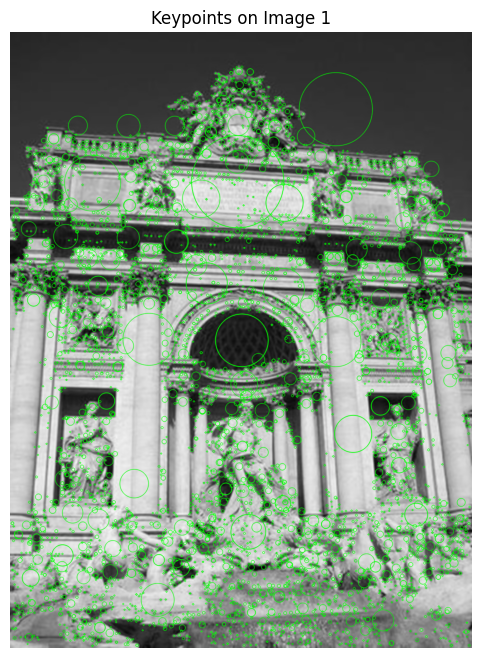

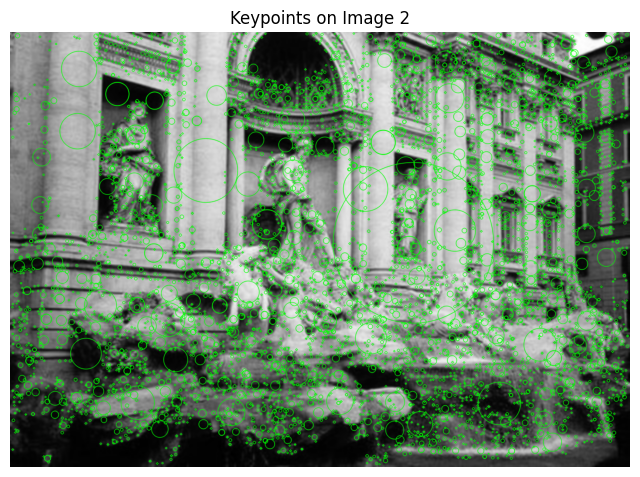

Run Time : 1.016188144683838


In [22]:
start = time.time()
def draw_keypoints(image, keypoints, title):
    # Ensure the image is in 8-bit format and RGB
    if image.dtype != np.uint8:
        image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    if len(image.shape) == 2:  # If grayscale, convert to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    else:  # If BGR, convert to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Create KeyPoint objects for OpenCV
    cv2_keypoints = [cv2.KeyPoint(k.pt[0], k.pt[1], k.size) for k in keypoints]

    # Draw keypoints on the image
    keypoints_image = cv2.drawKeypoints(image_rgb, cv2_keypoints, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Plot the image with keypoints
    plt.figure(figsize=(8, 8))
    plt.title(title)
    plt.imshow(keypoints_image)
    plt.axis('off')
    plt.show()

# Draw and display keypoints for both images
draw_keypoints(base_image1, keypoints1, title="Keypoints on Image 1")
draw_keypoints(base_image2, keypoints2, title="Keypoints on Image 2")

end = time.time()
runtime13 = end - start
print(f"Run Time : {runtime13}")

# **Compute Keypoints With Orientation and Histogram**

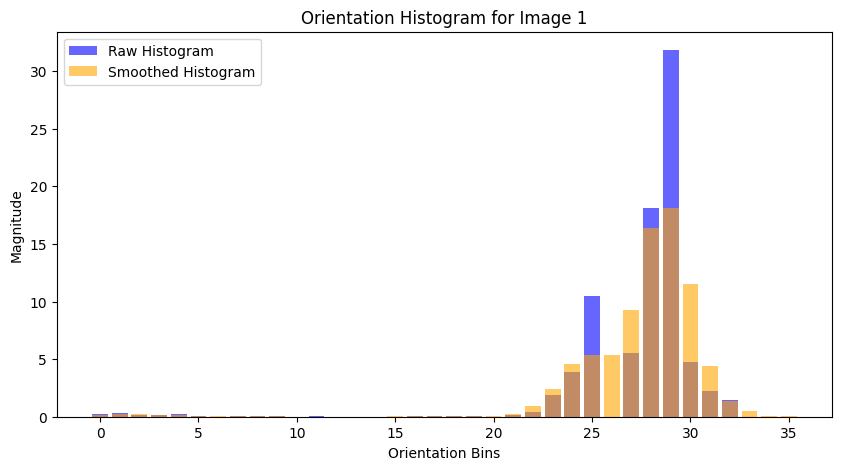

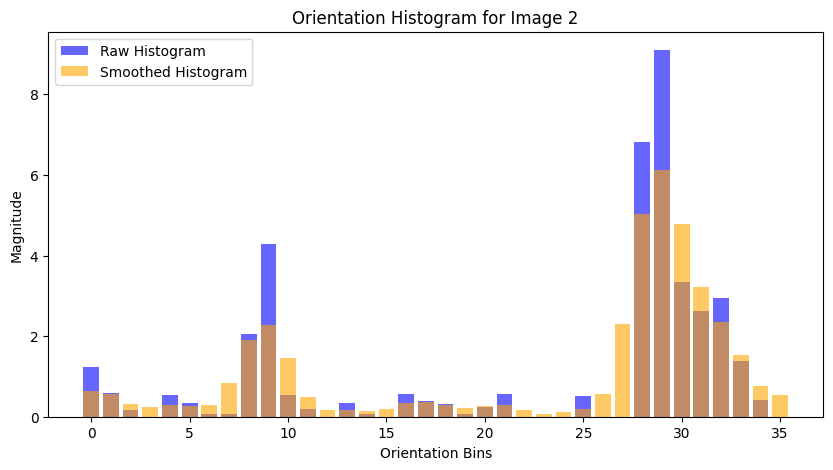

Run Time : 1.0512611865997314


In [35]:
start = time.time()
def computeKeypointsWithOrientationsAndHistograms(keypoint, octave_index, gaussian_image, radius_factor=3, num_bins=36, peak_ratio=0.8, scale_factor=1.5):

    keypoints_with_orientations = []
    image_shape = gaussian_image.shape

    scale = scale_factor * keypoint.size / float32(2 ** (octave_index + 1))
    radius = int(round(radius_factor * scale))
    weight_factor = -0.5 / (scale ** 2)
    raw_histogram = zeros(num_bins)
    smooth_histogram = zeros(num_bins)

    for i in range(-radius, radius + 1):
        region_y = int(round(keypoint.pt[1] / float32(2 ** octave_index))) + i
        if region_y > 0 and region_y < image_shape[0] - 1:
            for j in range(-radius, radius + 1):
                region_x = int(round(keypoint.pt[0] / float32(2 ** octave_index))) + j
                if region_x > 0 and region_x < image_shape[1] - 1:
                    dx = gaussian_image[region_y, region_x + 1] - gaussian_image[region_y, region_x - 1]
                    dy = gaussian_image[region_y - 1, region_x] - gaussian_image[region_y + 1, region_x]
                    gradient_magnitude = sqrt(dx * dx + dy * dy)
                    gradient_orientation = rad2deg(arctan2(dy, dx))
                    weight = exp(weight_factor * (i ** 2 + j ** 2))
                    histogram_index = int(round(gradient_orientation * num_bins / 360.))
                    raw_histogram[histogram_index % num_bins] += weight * gradient_magnitude

    for n in range(num_bins):
        smooth_histogram[n] = (6 * raw_histogram[n] + 4 * (raw_histogram[n - 1] + raw_histogram[(n + 1) % num_bins]) +
                               raw_histogram[n - 2] + raw_histogram[(n + 2) % num_bins]) / 16.

    return raw_histogram, smooth_histogram
import matplotlib.pyplot as plt

# Select a sample keypoint
sample_keypoint1 = keypoints1[0]  # Replace with any keypoint from keypoints1
sample_keypoint2 = keypoints2[0]  # Replace with any keypoint from keypoints2

# Compute histograms
raw_histogram1, smooth_histogram1 = computeKeypointsWithOrientationsAndHistograms(sample_keypoint1, octave_index=0, gaussian_image=gaussian_images1[0][0])
raw_histogram2, smooth_histogram2 = computeKeypointsWithOrientationsAndHistograms(sample_keypoint2, octave_index=0, gaussian_image=gaussian_images2[0][0])

# Plot histograms
def plot_histogram(raw_histogram, smooth_histogram, title):
    bins = range(len(raw_histogram))
    plt.figure(figsize=(10, 5))
    plt.bar(bins, raw_histogram, alpha=0.6, label='Raw Histogram', color='blue')
    plt.bar(bins, smooth_histogram, alpha=0.6, label='Smoothed Histogram', color='orange')
    plt.title(title)
    plt.xlabel('Orientation Bins')
    plt.ylabel('Magnitude')
    plt.legend()
    plt.show()

plot_histogram(raw_histogram1, smooth_histogram1, title="Orientation Histogram for Image 1")
plot_histogram(raw_histogram2, smooth_histogram2, title="Orientation Histogram for Image 2")

end = time.time()
runtime14 = end - start
print(f"Run Time : {runtime14}")

# **Remove Duplicate Keypoints**

In [23]:
start = time.time()
def compareKeypoints(keypoint1, keypoint2):
    """Return True if keypoint1 is less than keypoint2
    """
    if keypoint1.pt[0] != keypoint2.pt[0]:
        return keypoint1.pt[0] - keypoint2.pt[0]
    if keypoint1.pt[1] != keypoint2.pt[1]:
        return keypoint1.pt[1] - keypoint2.pt[1]
    if keypoint1.size != keypoint2.size:
        return keypoint2.size - keypoint1.size
    if keypoint1.angle != keypoint2.angle:
        return keypoint1.angle - keypoint2.angle
    if keypoint1.response != keypoint2.response:
        return keypoint2.response - keypoint1.response
    if keypoint1.octave != keypoint2.octave:
        return keypoint2.octave - keypoint1.octave
    return keypoint2.class_id - keypoint1.class_id

end = time.time()
runtime15 = end - start
print(f"Run Time : {runtime15}")

Run Time : 0.0003249645233154297


In [25]:
start = time.time()
def removeDuplicateKeypoints(keypoints):
    """Sort keypoints and remove duplicate keypoints
    """
    if len(keypoints) < 2:
        return keypoints

    keypoints.sort(key=cmp_to_key(compareKeypoints))
    unique_keypoints = [keypoints[0]]

    for next_keypoint in keypoints[1:]:
        last_unique_keypoint = unique_keypoints[-1]
        if last_unique_keypoint.pt[0] != next_keypoint.pt[0] or \
           last_unique_keypoint.pt[1] != next_keypoint.pt[1] or \
           last_unique_keypoint.size != next_keypoint.size or \
           last_unique_keypoint.angle != next_keypoint.angle:
            unique_keypoints.append(next_keypoint)
    return unique_keypoints
keypoints1 = removeDuplicateKeypoints(keypoints1)
keypoints2 = removeDuplicateKeypoints(keypoints2)

print(f"Total Keypoints detected in image1 : {len(keypoints1)}")
print(f"Total Keypoints detected in image2 : {len(keypoints2)}")

end = time.time()
runtime16 = end - start
print(f"Run Time : {runtime16}")

Total Keypoints detected in image1 : 6613
Total Keypoints detected in image2 : 6775
Run Time : 0.5147085189819336


# **Convert Keypoints to Input Image Size**

In [26]:
start = time.time()
def convertKeypointsToInputImageSize(keypoints):
    """Convert keypoint point, size, and octave to input image size
    """
    converted_keypoints = []
    for keypoint in keypoints:
        keypoint.pt = tuple(0.5 * array(keypoint.pt))
        keypoint.size *= 0.5
        keypoint.octave = (keypoint.octave & ~255) | ((keypoint.octave - 1) & 255)
        converted_keypoints.append(keypoint)
    return converted_keypoints
kp1 = convertKeypointsToInputImageSize(keypoints1)
kp2 = convertKeypointsToInputImageSize(keypoints2)

end = time.time()
runtime17 = end - start
print(f"Run Time : {runtime17}")

Run Time : 0.06433868408203125


# **Generate Descriptors**

In [27]:
start = time.time()
def unpackOctave(keypoint):
    octave = keypoint.octave & 255
    layer = (keypoint.octave >> 8) & 255
    if octave >= 128:
        octave = octave | -128
    scale = 1 / float32(1 << octave) if octave >= 0 else float32(1 << -octave)
    return octave, layer, scale

end = time.time()
runtime18 = end - start
print(f"Run Time : {runtime18}")

Run Time : 0.0002460479736328125


In [28]:
start = time.time()
def generateDescriptors(keypoints, gaussian_images, window_width=4, num_bins=8, scale_multiplier=3, descriptor_max_value=0.2):
    descriptors = []

    for keypoint in keypoints:
        octave, layer, scale = unpackOctave(keypoint)
        gaussian_image = gaussian_images[octave + 1, layer]
        num_rows, num_cols = gaussian_image.shape
        point = round(scale * array(keypoint.pt)).astype('int')
        bins_per_degree = num_bins / 360.
        angle = 360. - keypoint.angle
        cos_angle = cos(deg2rad(angle))
        sin_angle = sin(deg2rad(angle))
        weight_multiplier = -0.5 / ((0.5 * window_width) ** 2)
        row_bin_list = []
        col_bin_list = []
        magnitude_list = []
        orientation_bin_list = []
        histogram_tensor = zeros((window_width + 2, window_width + 2, num_bins))   # first two dimensions are increased by 2 to account for border effects

        # Descriptor window size (described by half_width) follows OpenCV convention
        hist_width = scale_multiplier * 0.5 * scale * keypoint.size
        half_width = int(round(hist_width * sqrt(2) * (window_width + 1) * 0.5))   # sqrt(2) corresponds to diagonal length of a pixel
        half_width = int(min(half_width, sqrt(num_rows ** 2 + num_cols ** 2)))     # ensure half_width lies within image

        for row in range(-half_width, half_width + 1):
            for col in range(-half_width, half_width + 1):
                row_rot = col * sin_angle + row * cos_angle
                col_rot = col * cos_angle - row * sin_angle
                row_bin = (row_rot / hist_width) + 0.5 * window_width - 0.5
                col_bin = (col_rot / hist_width) + 0.5 * window_width - 0.5
                if row_bin > -1 and row_bin < window_width and col_bin > -1 and col_bin < window_width:
                    window_row = int(round(point[1] + row))
                    window_col = int(round(point[0] + col))
                    if window_row > 0 and window_row < num_rows - 1 and window_col > 0 and window_col < num_cols - 1:
                        dx = gaussian_image[window_row, window_col + 1] - gaussian_image[window_row, window_col - 1]
                        dy = gaussian_image[window_row - 1, window_col] - gaussian_image[window_row + 1, window_col]
                        gradient_magnitude = sqrt(dx * dx + dy * dy)
                        gradient_orientation = rad2deg(arctan2(dy, dx)) % 360
                        weight = exp(weight_multiplier * ((row_rot / hist_width) ** 2 + (col_rot / hist_width) ** 2))
                        row_bin_list.append(row_bin)
                        col_bin_list.append(col_bin)
                        magnitude_list.append(weight * gradient_magnitude)
                        orientation_bin_list.append((gradient_orientation - angle) * bins_per_degree)

        for row_bin, col_bin, magnitude, orientation_bin in zip(row_bin_list, col_bin_list, magnitude_list, orientation_bin_list):
            # Smoothing via trilinear interpolation
            # Notations follows https://en.wikipedia.org/wiki/Trilinear_interpolation
            # Note that we are really doing the inverse of trilinear interpolation here (we take the center value of the cube and distribute it among its eight neighbors)
            row_bin_floor, col_bin_floor, orientation_bin_floor = floor([row_bin, col_bin, orientation_bin]).astype(int)
            row_fraction, col_fraction, orientation_fraction = row_bin - row_bin_floor, col_bin - col_bin_floor, orientation_bin - orientation_bin_floor
            if orientation_bin_floor < 0:
                orientation_bin_floor += num_bins
            if orientation_bin_floor >= num_bins:
                orientation_bin_floor -= num_bins

            c1 = magnitude * row_fraction
            c0 = magnitude * (1 - row_fraction)
            c11 = c1 * col_fraction
            c10 = c1 * (1 - col_fraction)
            c01 = c0 * col_fraction
            c00 = c0 * (1 - col_fraction)
            c111 = c11 * orientation_fraction
            c110 = c11 * (1 - orientation_fraction)
            c101 = c10 * orientation_fraction
            c100 = c10 * (1 - orientation_fraction)
            c011 = c01 * orientation_fraction
            c010 = c01 * (1 - orientation_fraction)
            c001 = c00 * orientation_fraction
            c000 = c00 * (1 - orientation_fraction)

            histogram_tensor[row_bin_floor + 1, col_bin_floor + 1, orientation_bin_floor] += c000
            histogram_tensor[row_bin_floor + 1, col_bin_floor + 1, (orientation_bin_floor + 1) % num_bins] += c001
            histogram_tensor[row_bin_floor + 1, col_bin_floor + 2, orientation_bin_floor] += c010
            histogram_tensor[row_bin_floor + 1, col_bin_floor + 2, (orientation_bin_floor + 1) % num_bins] += c011
            histogram_tensor[row_bin_floor + 2, col_bin_floor + 1, orientation_bin_floor] += c100
            histogram_tensor[row_bin_floor + 2, col_bin_floor + 1, (orientation_bin_floor + 1) % num_bins] += c101
            histogram_tensor[row_bin_floor + 2, col_bin_floor + 2, orientation_bin_floor] += c110
            histogram_tensor[row_bin_floor + 2, col_bin_floor + 2, (orientation_bin_floor + 1) % num_bins] += c111

        descriptor_vector = histogram_tensor[1:-1, 1:-1, :].flatten()  # Remove histogram borders
        # Threshold and normalize descriptor_vector
        threshold = norm(descriptor_vector) * descriptor_max_value
        descriptor_vector[descriptor_vector > threshold] = threshold
        descriptor_vector /= max(norm(descriptor_vector), float_tolerance)
        # Multiply by 512, round, and saturate between 0 and 255 to convert from float32 to unsigned char (OpenCV convention)
        descriptor_vector = round(512 * descriptor_vector)
        descriptor_vector[descriptor_vector < 0] = 0
        descriptor_vector[descriptor_vector > 255] = 255
        descriptors.append(descriptor_vector)
    return array(descriptors, dtype='float32')

# Compute SIFT keypoints and descriptors
des1 = generateDescriptors(kp1, gaussian_images1)
des2 = generateDescriptors(kp2, gaussian_images2)

print(f"Total descripto detected in image1 : {len(des1)}")
print(f"Total descriptor detected in image2 : {len(des2)}")

end = time.time()
runtime19 = end - start
print(f"Run Time : {runtime19}")

Total descripto detected in image1 : 6613
Total descriptor detected in image2 : 6775
Run Time : 618.9428610801697


In [29]:
des1[0]

array([ 39.,  12.,   2.,   2.,   0.,   0.,   1.,  80.,  40.,  33.,  39.,
       148.,   9.,   0.,   0.,  19.,  33.,  18.,  23., 123.,  74.,  22.,
        25.,  41.,  43.,   1.,   7.,  40.,  17.,  11.,  23., 120.,   3.,
         3.,   1.,  33.,   3.,   0.,   1.,   3.,  24.,  23.,  35., 148.,
        35.,   0.,   0.,   1., 148.,  76.,  38.,  92.,   8.,   0.,   3.,
        13.,  47.,   8.,  10., 141.,  26.,   0.,   4.,  30.,   0.,   0.,
         0.,  12.,   1.,   0.,   0.,   0.,  97.,  10.,   9., 137.,  27.,
         0.,   0.,  14., 148.,  19.,   7.,  28.,  22.,   7.,   1.,  42.,
        55.,   4.,   3.,  38.,  38.,  15.,   9.,  45.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,  35.,   1.,   1.,   1.,   0.,   0.,
         2.,  35., 112.,   0.,   0.,   0.,  12.,  19.,  24., 120.,   8.,
         2.,   9.,  20.,  23.,  18.,   7.,  12.], dtype=float32)

# **Brute Force Matching**


Number of Matching Keypoints Between The Training and Query Images:  6613


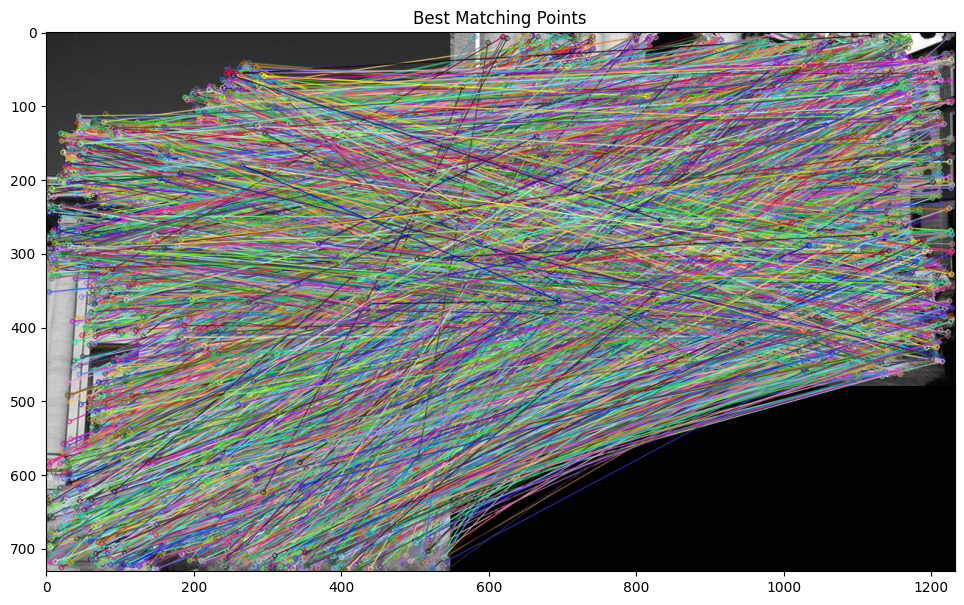

Run Time : 4.086524248123169


In [31]:
start = time.time()
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)

# Perform the matching between the SIFT descriptors of the training image and the test image
matches = bf.match(des1, des2)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img1, kp1, img2, kp2, matches, base_image1, flags = 2)

# Print total number of matching points between the training and test images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

end = time.time()
runtime20 = end - start
print(f"Run Time : {runtime20}")

# **Total Run Time**

In [38]:
total_runtime = runtime1 + runtime2 + runtime3 + runtime4 + runtime5 + runtime6 + runtime7 + runtime8 + runtime9 + runtime10 + runtime11 + runtime12 + runtime13 + runtime14 + runtime15 + runtime16 + runtime17 + runtime18 + runtime19 + runtime20 + runtime21
print(f"Total Runtime : {total_runtime}")

Total Runtime : 889.3321330547333
